In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [ ]:
# Step 1: Import the drive module
from google.colab import drive

# Step 2: Mount the drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

print(os.listdir('/content/drive/My Drive'))

['Transcript_ShaibalDas (1).pdf', 'Transcript_ShaibalDas.pdf', 'Grade book.gsheet', 'Assignment3.m', 'Shaibal_Das.pdf', '1667337515804.jpg', 'ME-3322 Grading.gsheet', 'Shaibal_Das_Resume (1).pdf', 'Shaibal_Das_Resume.pdf', 'CERE Small Grant Proposal_Taher Deemyad_2022.docx', 'ShaibalDas20221042SBCD (2).pdf', 'Main GNSS antenna of rover.jpg', 'GPS-Guided Autonomous Robot with Obstacle Avoidance.docx', 'Mechatronics Project', 'Mechatronics Report (Berry and Das).docx', 'A Ground Control Station for a Multi-UAV Surveillance System.gdoc', 'Documents', 'May eStatement.pdf', 'SKB06858.jpeg', 'Summer worksheet-Shaibal Das.gdoc', 'New Microsoft PowerPoint Presentation.pptx', '158250267309.jpeg', '2', 'GTA Acceptance (1).pdf', 'BSA', 'Colab Notebooks', 'members list.pdf', 'Shaibal_Das_CV (1).pdf', 'Robot Training Modules', 'Drone Detection using YOLOv8.pptx', 'Pitha Party .gsheet', 'GTA Acceptance.pdf', 'Shaibal_Das_CV.pdf', 'Academic Transcript-ISU.pdf', 'Professors_ML_Bioinformatics_CV_NLP_Se

In [ ]:
#file_path = '/content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/images/train'

In [ ]:
ls /content

drive/  sample_data/  yolov5/


In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data '/content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/drone1.yaml' --weights yolov5s.pt

2024-05-28 00:10:06.766197: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-28 00:10:06.766252: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-28 00:10:06.767780: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/drone1.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weigh

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source '/content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/images/val/DJI_FPV_Cloudy (940).jpg'

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/images/val/DJI_FPV_Cloudy (940).jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-314-g60dde7f1 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
Model summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/images/val/DJI_FPV_Cloudy (940).jpg: 288x640 1 drone, 103.7ms
Speed: 0.6ms pre-process, 103.7ms inference, 684.1ms NMS per image at 

Displaying: runs/detect/exp/DJI_FPV_Cloudy (940).jpg


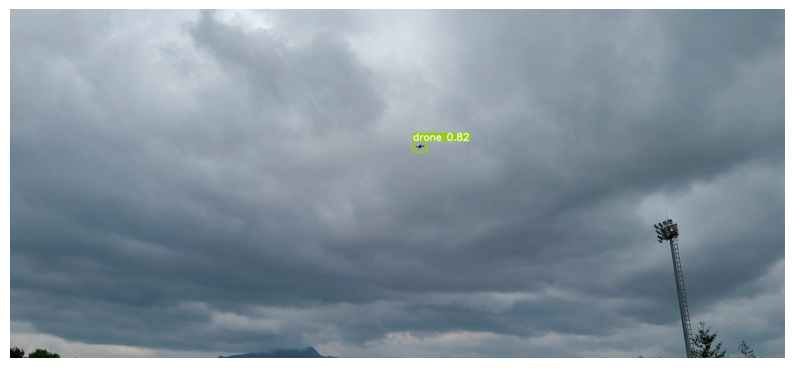

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Path to the folder where detection results are saved
results_folder = 'runs/detect/exp'  # Update this if your results are saved in a different folder

# List all images in the results folder
detected_images = [os.path.join(results_folder, img) for img in os.listdir(results_folder) if img.endswith(('.png', '.jpg', '.jpeg'))]

# Function to display an image
def display_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Display all detected images
for img_path in detected_images:
    print(f"Displaying: {img_path}")
    display_image(img_path)


## Automating Detection and Displaying

In [ ]:
# Step 4: Run detection on all images in the validation set
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source  '/content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/images/val' --save-txt --save-conf --save-crop

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/images/val, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=True, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-314-g60dde7f1 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
Model summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
image 1/223 /content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/images/val/DJI_FPV_Cloudy (1000).jpg: 288x640 1 drone, 106.8ms
image 2/223 /content/drive/My Drive/DroneDatasets/EditedDJIFPV_Cloudy/images/val/DJI_FPV_Cloudy (1001).jpg: 288x640 1 drone, 7.2ms
image 

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1187).jpg


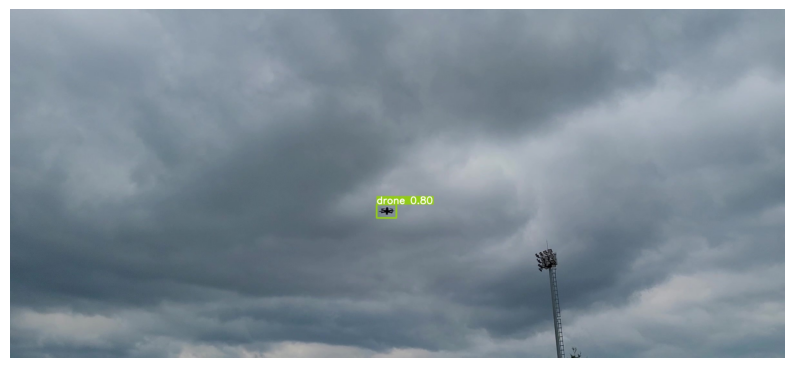

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (977).jpg


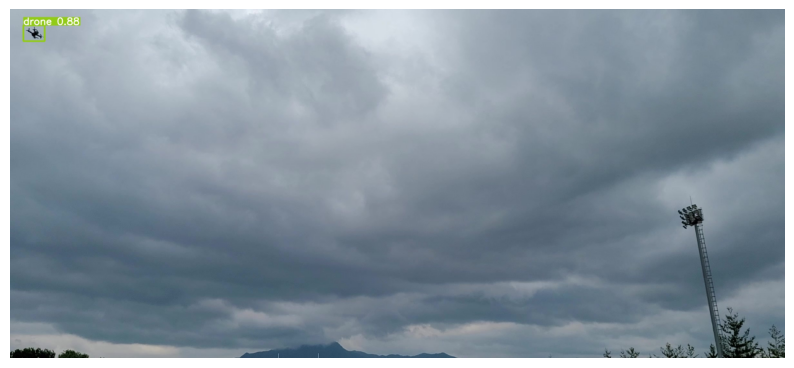

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1064).jpg


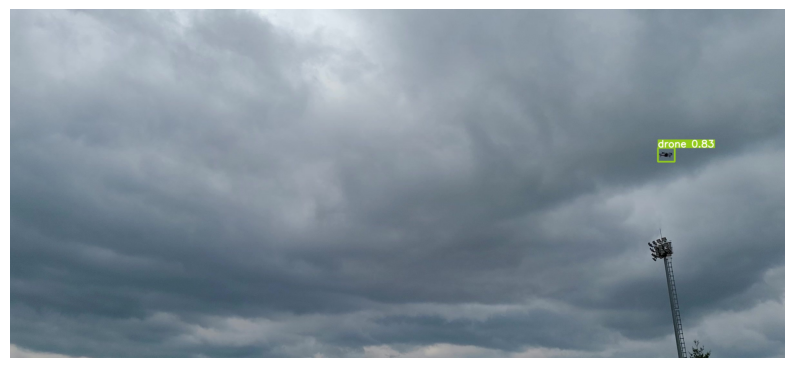

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1176).jpg


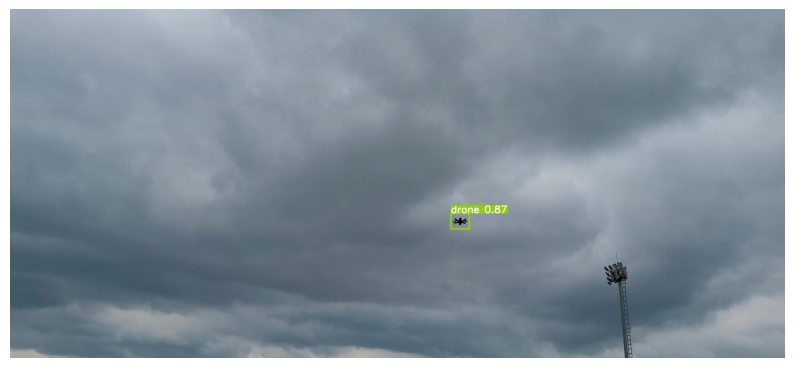

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1117).jpg


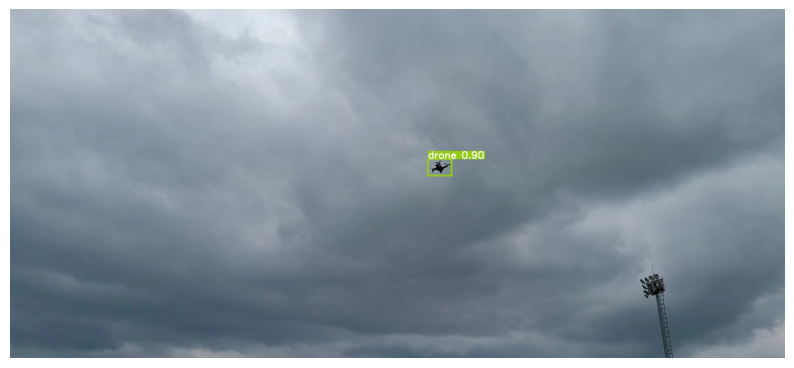

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (983).jpg


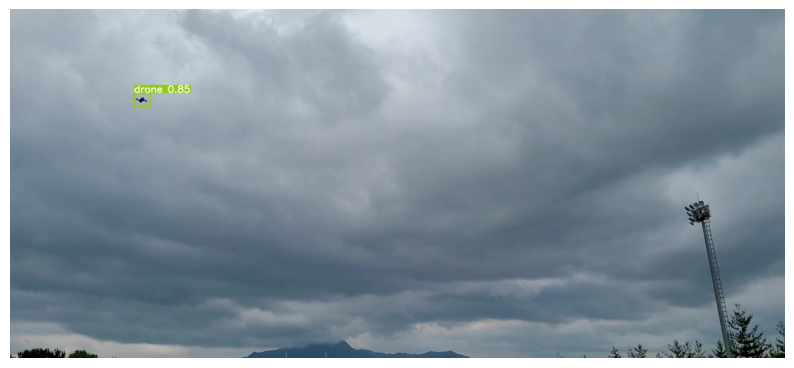

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (980).jpg


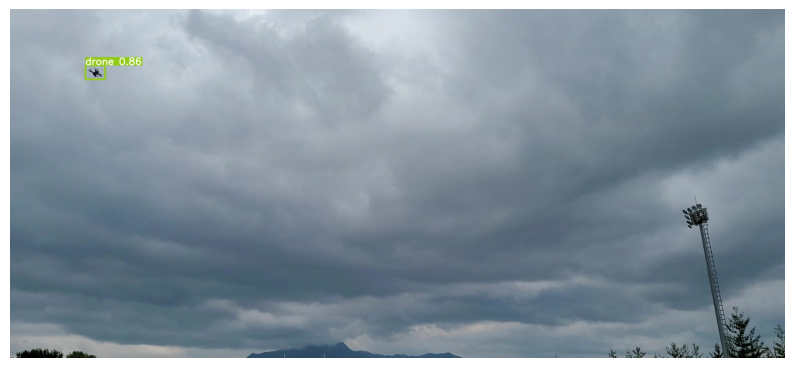

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1034).jpg


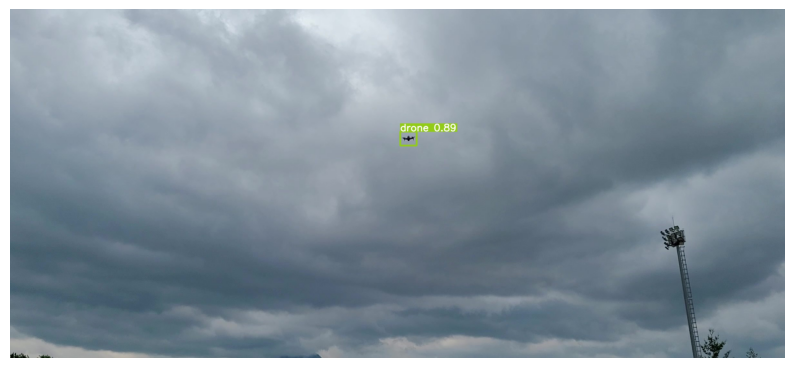

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (946).jpg


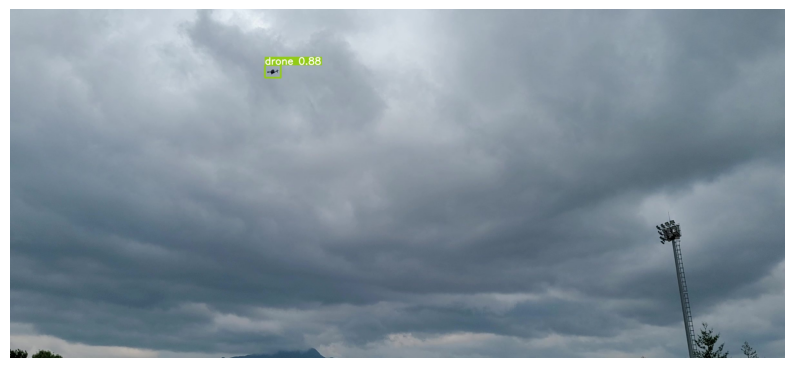

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1063).jpg


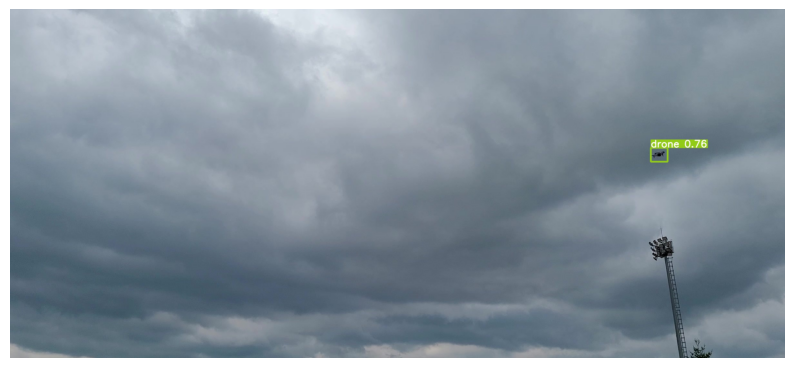

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1183).jpg


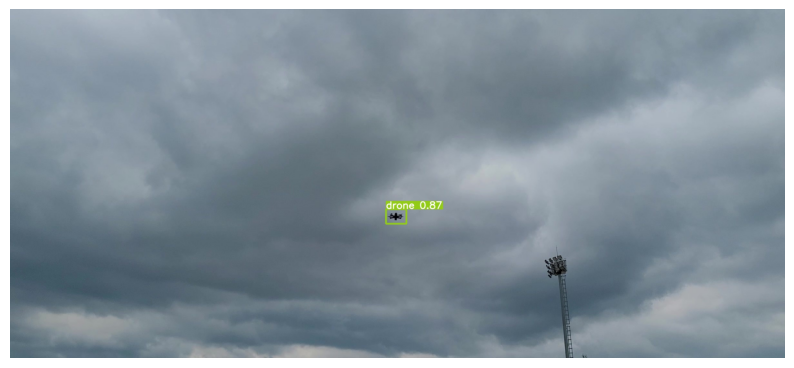

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1074).jpg


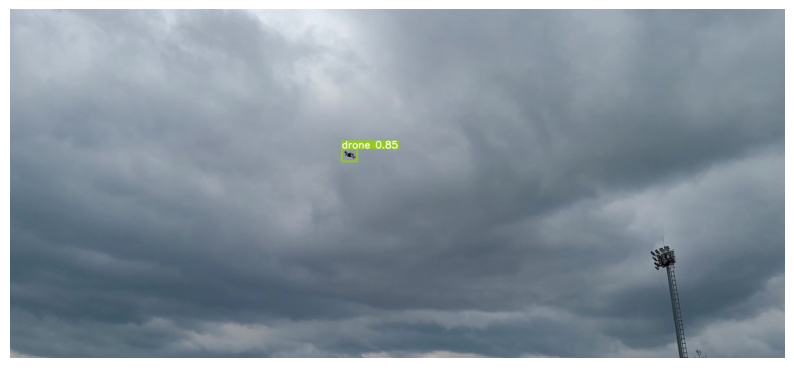

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (995).jpg


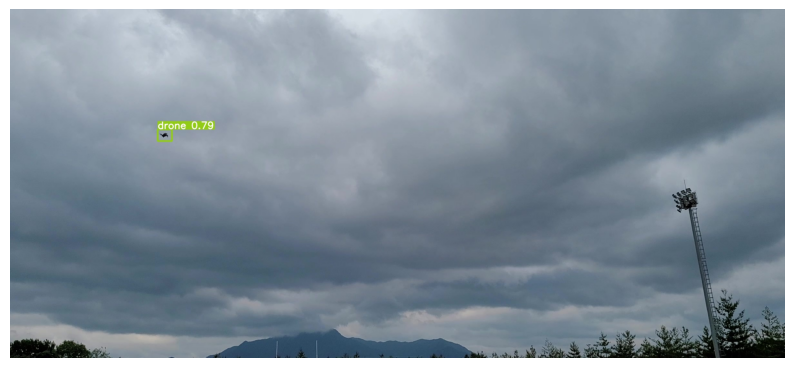

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1188).jpg


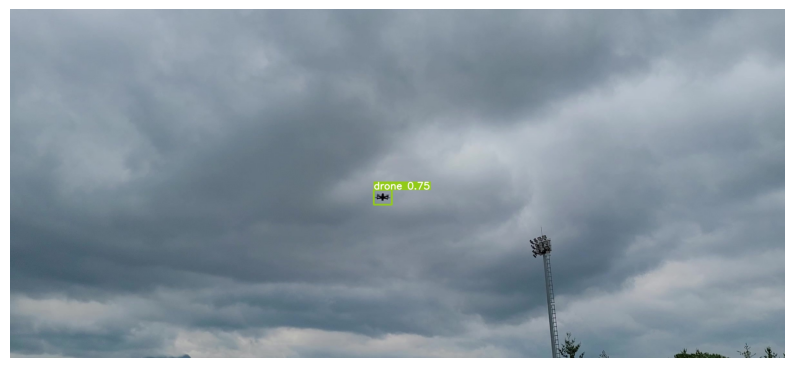

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1068).jpg


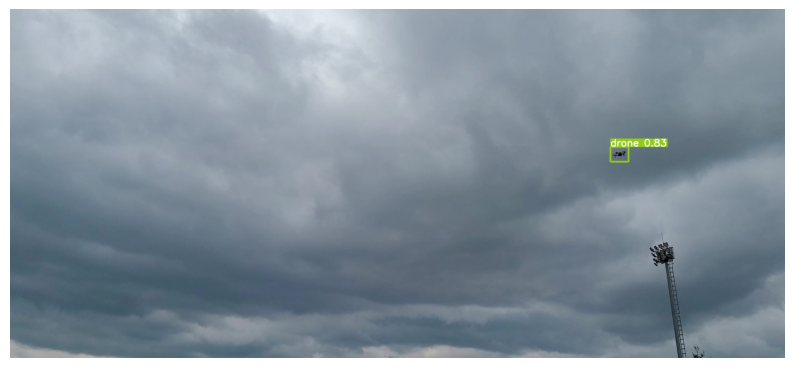

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1150).jpg


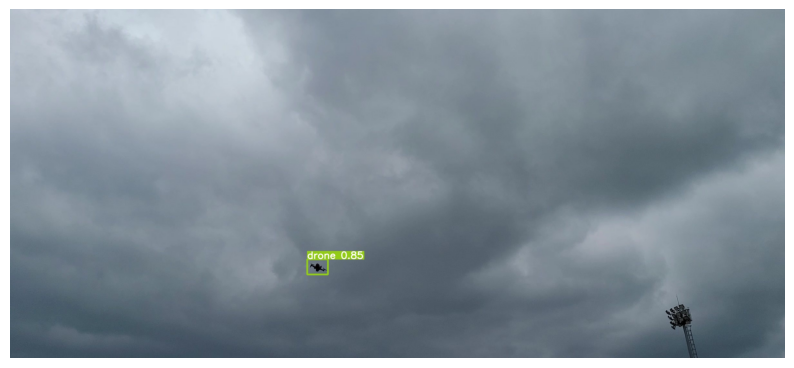

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (986).jpg


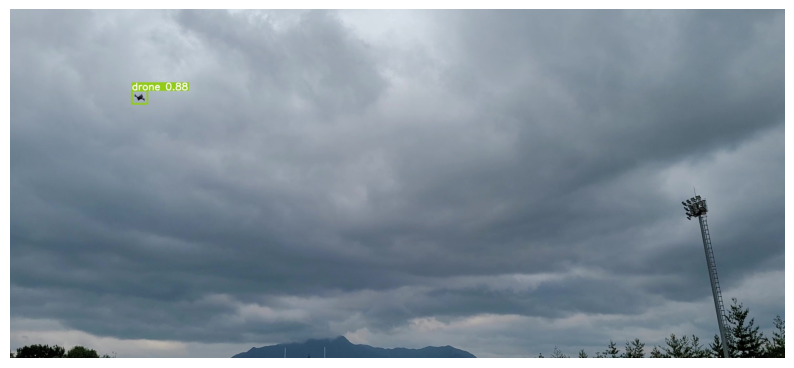

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1096).jpg


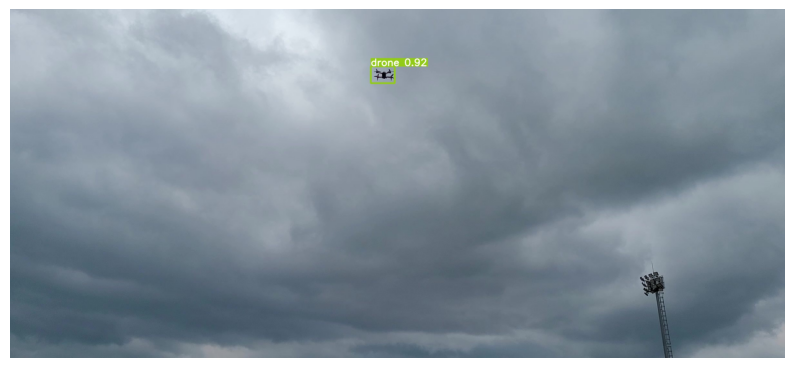

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1125).jpg


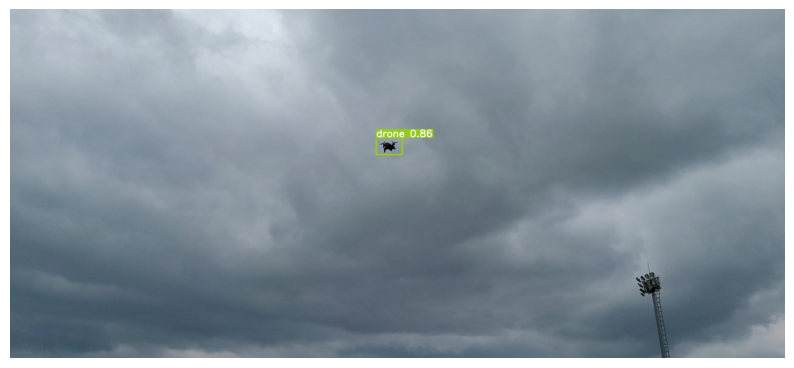

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (981).jpg


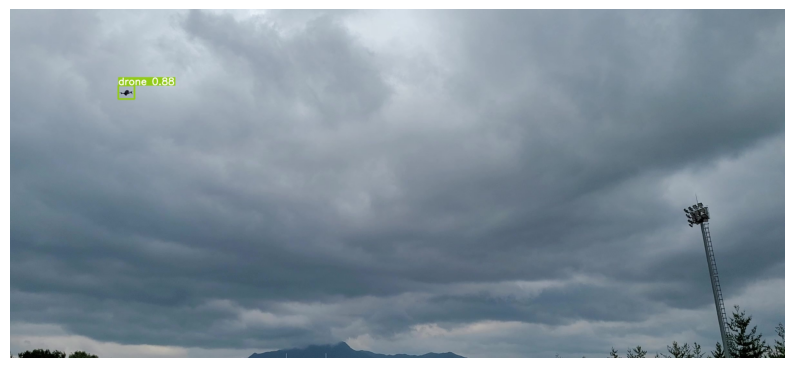

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1065).jpg


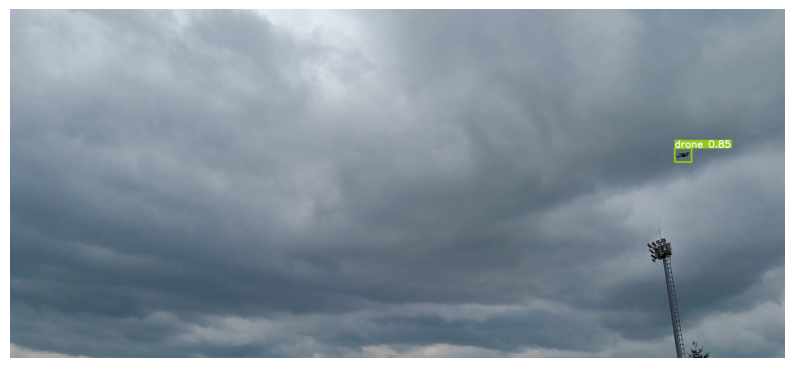

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1033).jpg


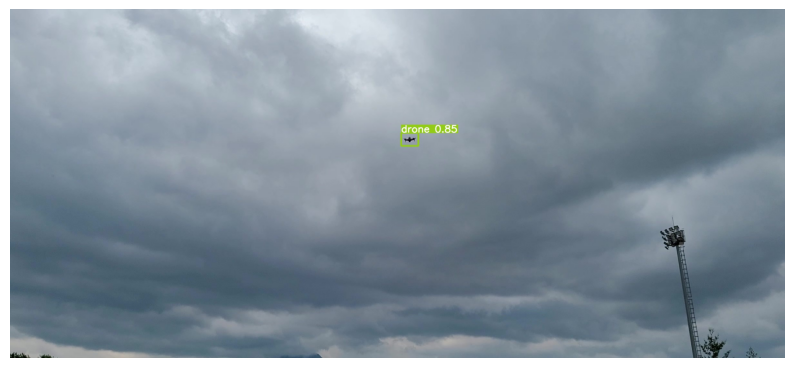

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1200).jpg


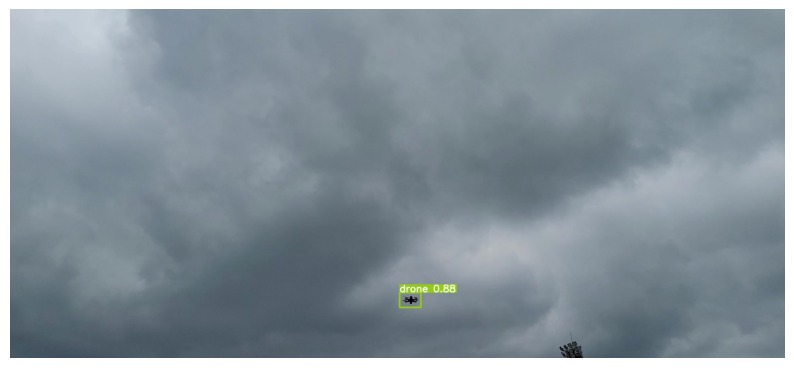

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1011).jpg


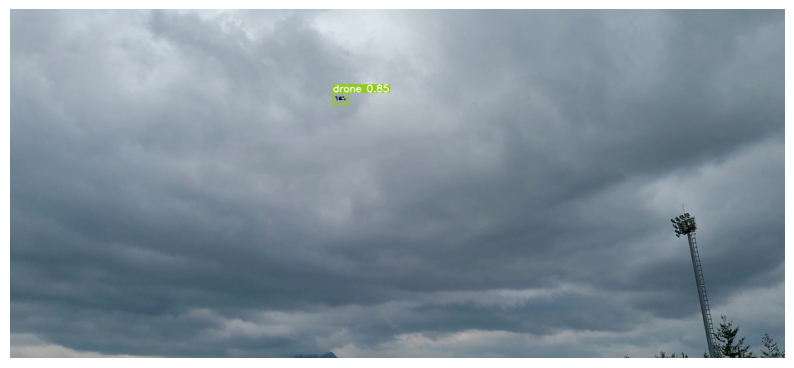

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1155).jpg


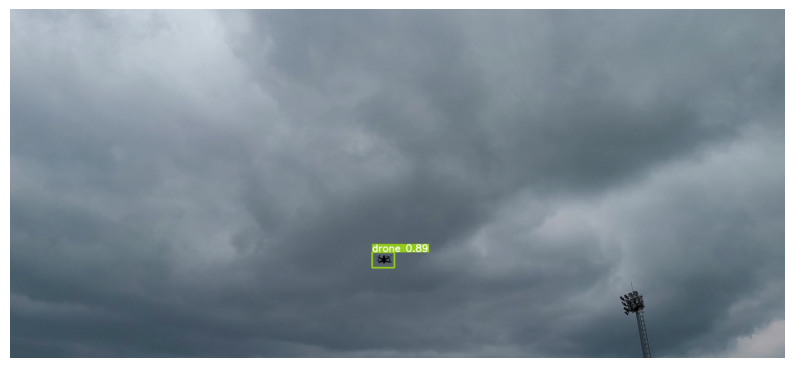

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1029).jpg


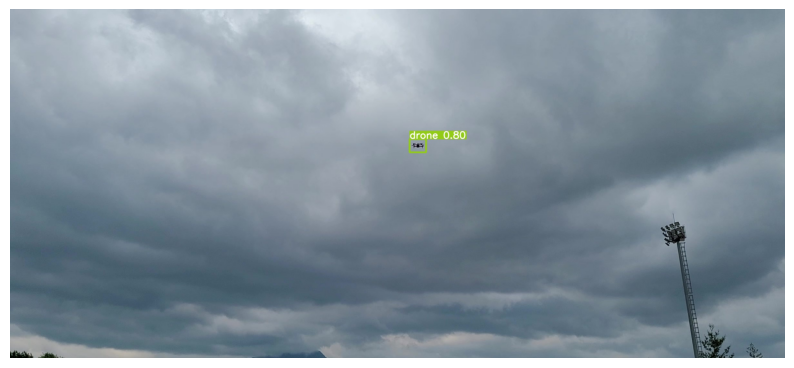

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1081).jpg


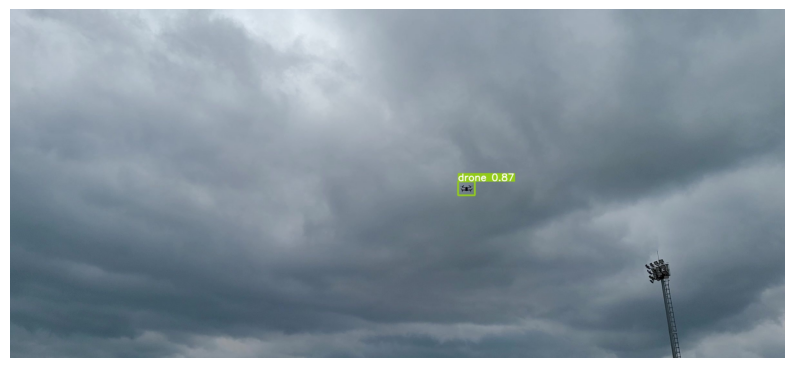

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1097).jpg


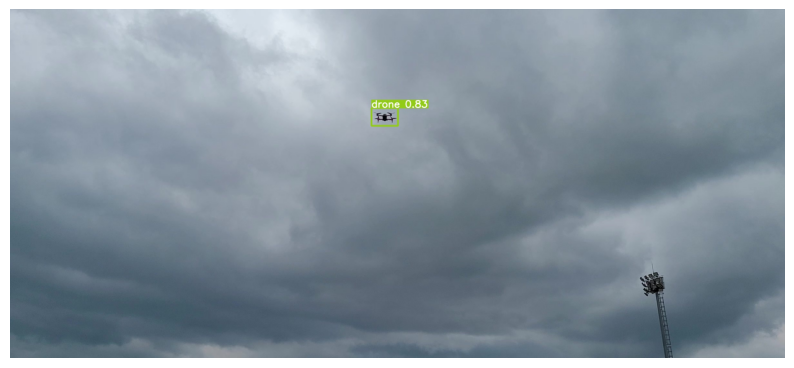

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1131).jpg


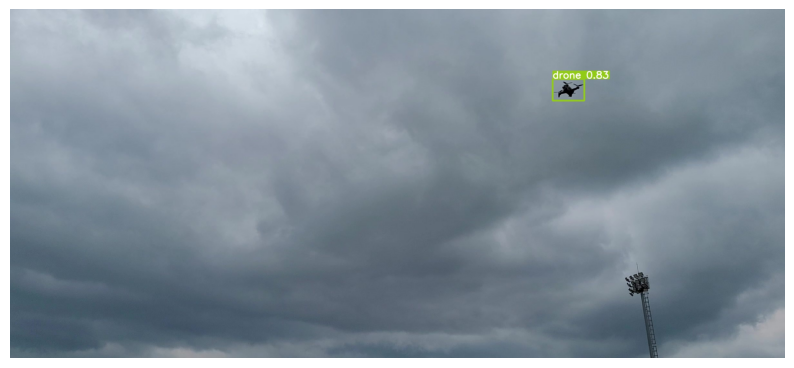

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1165).jpg


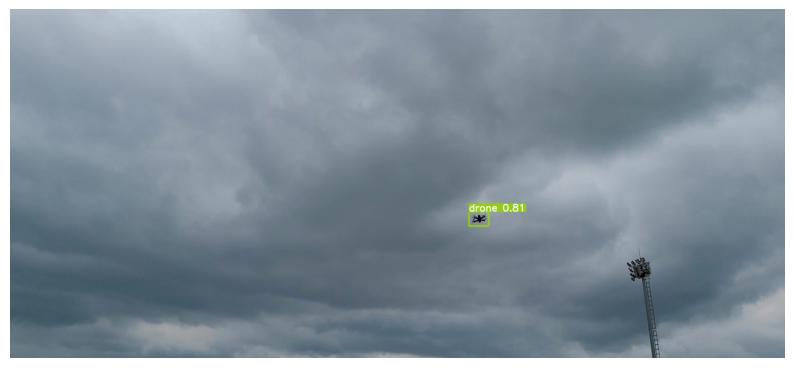

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (967).jpg


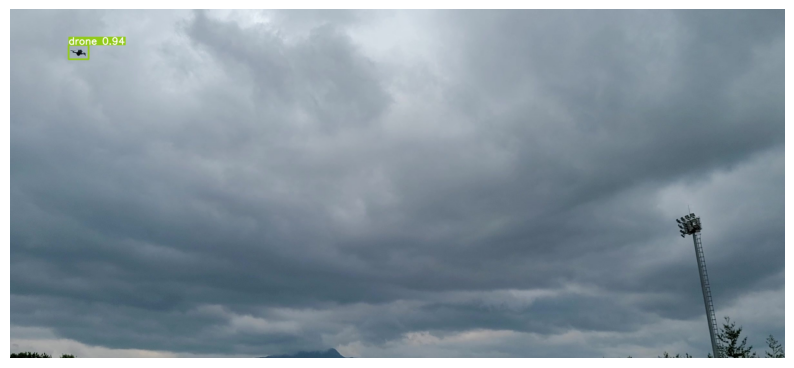

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1124).jpg


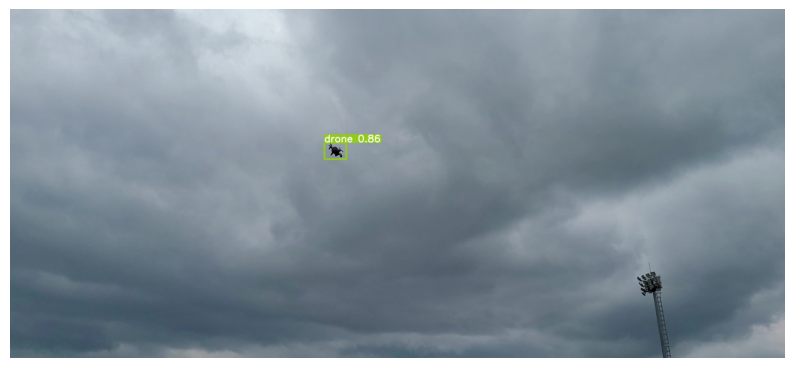

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1122).jpg


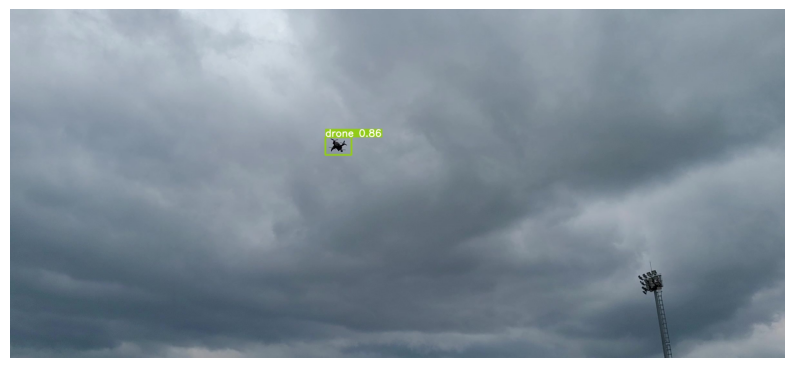

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (942).jpg


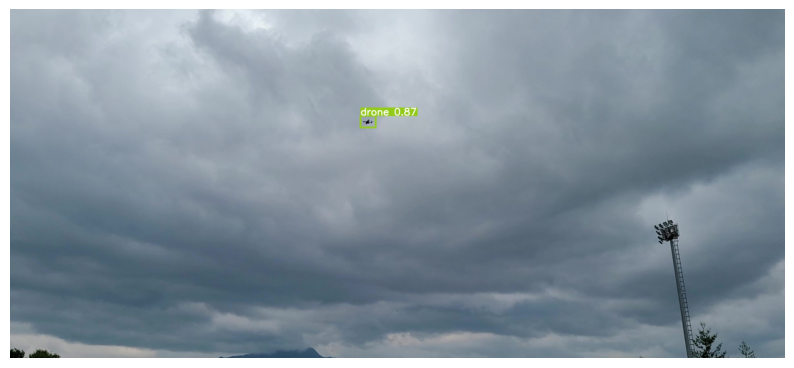

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1111).jpg


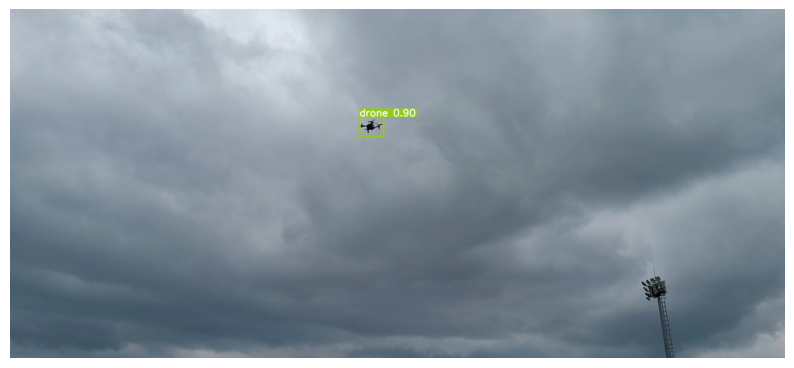

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1061).jpg


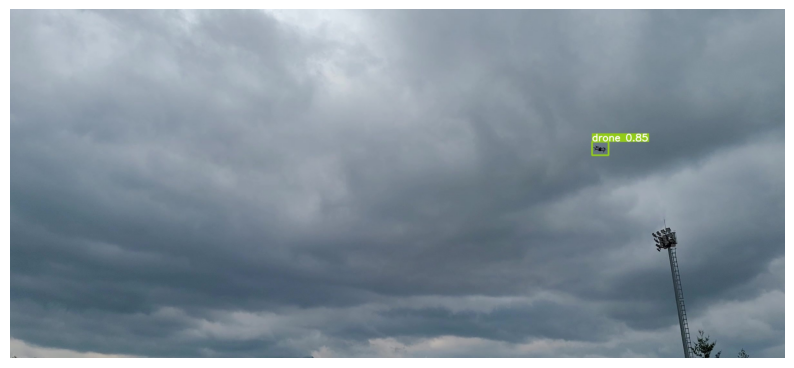

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (950).jpg


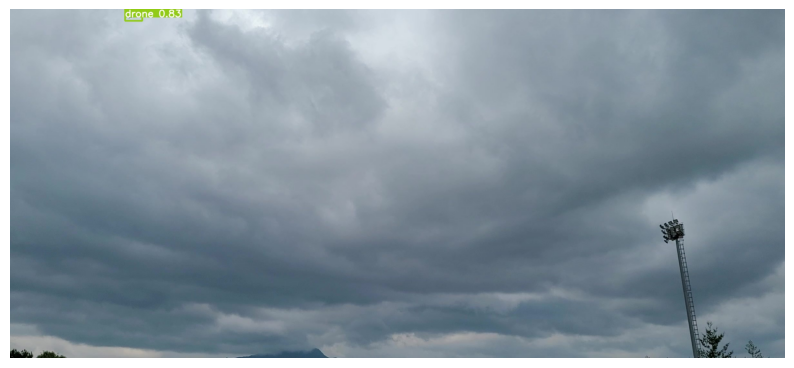

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (976).jpg


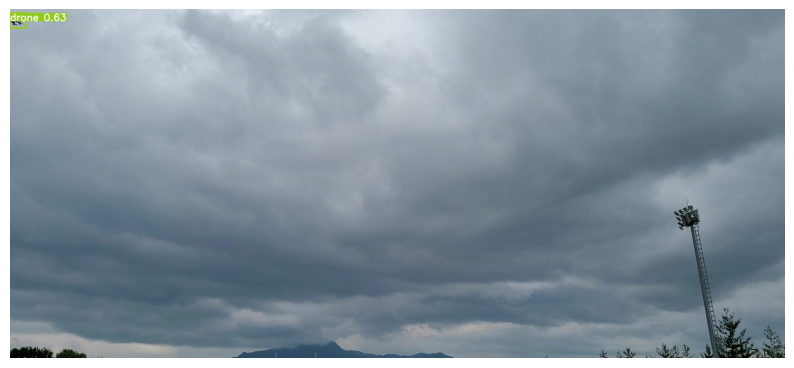

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1151).jpg


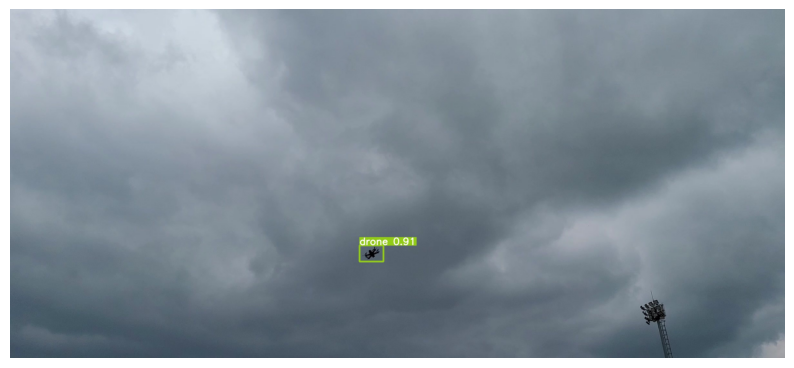

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (941).jpg


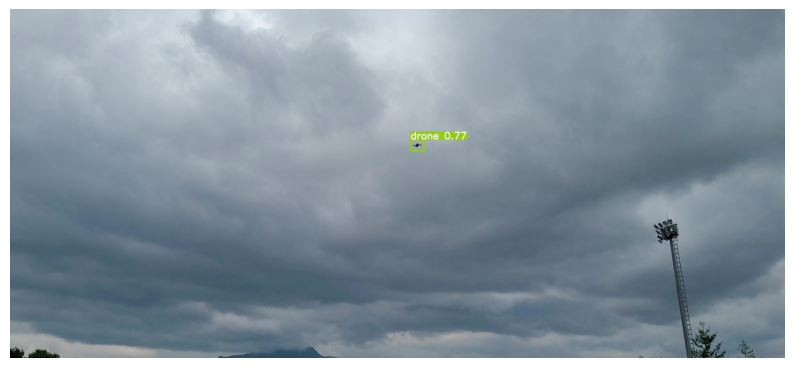

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (948).jpg


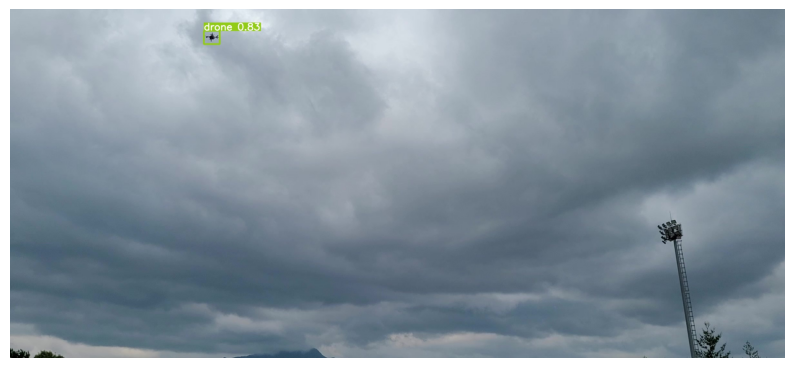

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1058).jpg


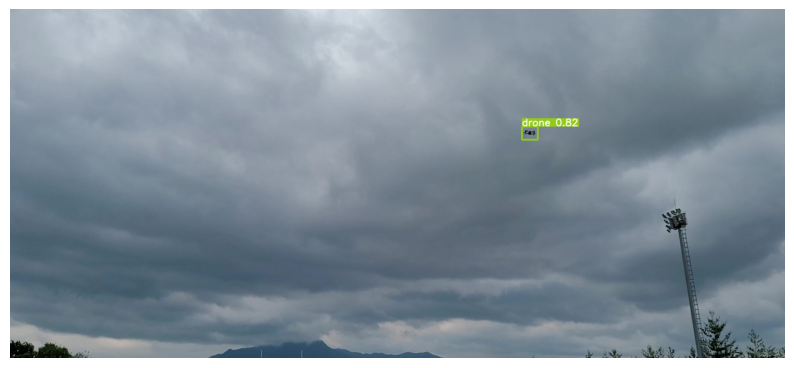

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1128).jpg


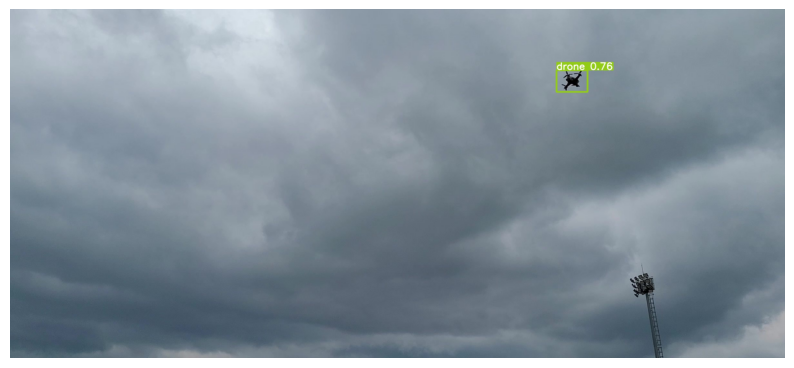

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1025).jpg


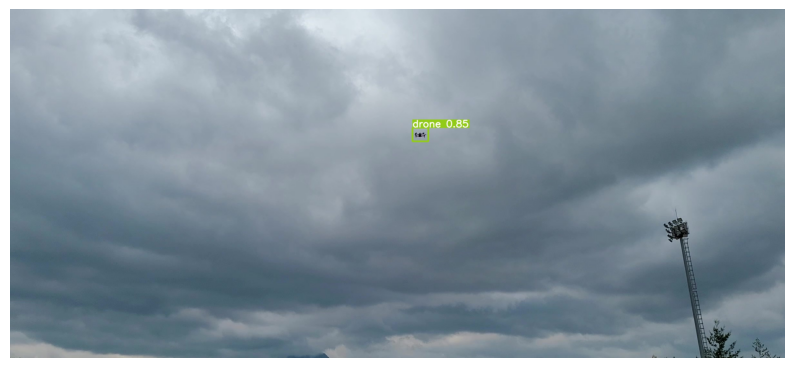

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1030).jpg


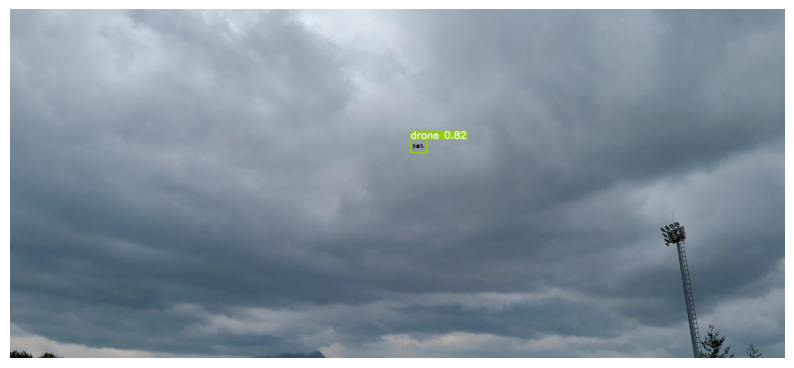

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1067).jpg


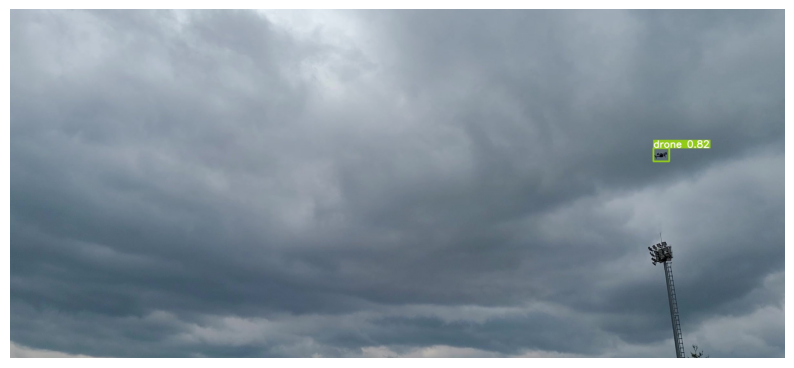

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (987).jpg


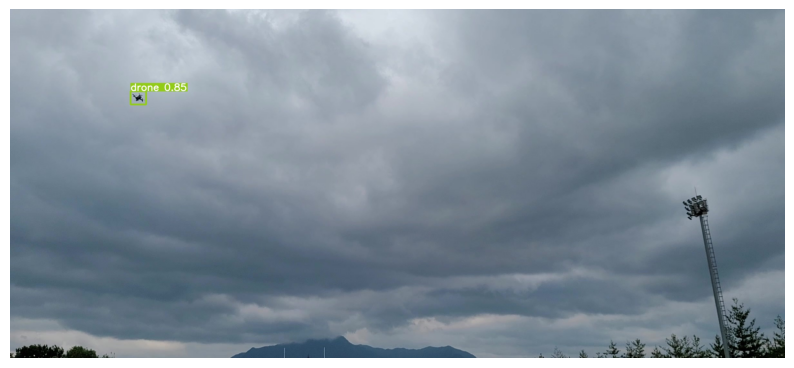

Displaying: runs/detect/exp2/DJI_FPV_Cloudy (1185).jpg


In [ ]:
# Step 5: Display the detection results
import cv2
import matplotlib.pyplot as plt
import os

# Path to the folder where detection results are saved
results_folder = 'runs/detect/exp2'  # Update this if your results are saved in a different folder

# List all images in the results folder
detected_images = [os.path.join(results_folder, img) for img in os.listdir(results_folder) if img.endswith(('.png', '.jpg', '.jpeg'))]

# Function to display an image with detections
def display_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Display all detected images
for img_path in detected_images:
    print(f"Displaying: {img_path}")
    display_image(img_path)